In [1]:
import os

subj = "Subj1"

match subj:
    case 'Subj1':
        N_STAGES = 9
        DEFAULT_QSDA_THRESHOLD = 0.4
    case 'Subj2':
        N_STAGES = 8
        DEFAULT_QSDA_THRESHOLD = 0.28
    case 'Subj3':
        N_STAGES = 10
        DEFAULT_QSDA_THRESHOLD = 0.32

DEFAULT_UNIQUE_VALUES_THRESHOLD = 200
subj = f"E:/CourseProject/{subj}"

exp = "exp_hyperparameters"
os.makedirs(f"{subj}/{exp}", exist_ok = True)

In [2]:
import mne
import tqdm
import numpy
import pandas
import sklearn.preprocessing
import sklearn.decomposition
import matplotlib.pyplot as plt

import SDA.analytics

In [3]:
def read_traditional():
    df_ft_psd_loc_db = pandas.read_feather(f'{subj}/src/df_ft_psd_loc_db.feather')
    df_ft_psd_ind_loc_log = pandas.read_feather(f'{subj}/src/df_ft_psd_ind_loc_log.feather')
    df_ft_coh_ind_loc = pandas.read_feather(f'{subj}/src/df_ft_coh_ind_loc.feather')
    df_ft_plv_ind_loc = pandas.read_feather(f'{subj}/src/df_ft_plv_ind_loc.feather')

    result =  pandas.concat([
        df_ft_psd_loc_db,
        df_ft_psd_ind_loc_log,
        df_ft_coh_ind_loc,
        df_ft_plv_ind_loc
    ], axis = 1)

    if subj == "Subj2":
        result = result[:-2]
    return result

epochs = mne.read_epochs(f"{subj}/src/epochs_filt_rr-epo.fif").drop_channels(ch_names = [ "A1", "A2" ])
if subj == "Subj2": # m8 (artifacts at the end)
    epochs = epochs[:-2]
data = epochs.get_data(copy = True)

original_traditional = read_traditional()

Reading E:\CourseProject\Subj1\src\epochs_filt_rr-epo.fif ...
    Found the data of interest:
        t =    -500.00 ...     500.00 ms
        0 CTF compensation matrices available
Not setting metadata
1046 matching events found
No baseline correction applied
0 projection items activated


In [4]:
def run_sda(all_features: pandas.DataFrame, n_components: int, folder: str):
    if os.path.exists(f"{folder}/stats.svg"):
        return
    os.makedirs(folder, exist_ok = True)

    # Scale features
    all_features = sklearn.preprocessing.StandardScaler().fit_transform(all_features)
    # numpy.save(f"{folder}/all_features.npy", all_features)
    # numpy.savetxt(f"{folder}/all_features_shape.txt", all_features.shape)

    # PCA
    pca = sklearn.decomposition.PCA(n_components = n_components, svd_solver = "full", random_state = 42)
    pca_features = pca.fit_transform(all_features)
    numpy.save(f"{folder}/pca_features.npy", pca_features)
    numpy.savetxt(f"{folder}/pca_features_shape.txt", pca_features.shape)
    
    numpy.savetxt(f"{folder}/explained_variance.txt", [ pca.explained_variance_ratio_.sum() ])
    numpy.savetxt(f"{folder}/explained_variance_ratios.txt", pca.explained_variance_ratio_)

    # SDA
    sda = SDA.SDA(n_jobs = 5, scale = False, verbose = False)
    results, df_st_edges = sda.apply(pca_features)
    
    results.to_csv(f"{folder}/results.csv")
    df_st_edges.to_csv(f"{folder}/df_st_edges.csv")

    # Analyze
    best_results = SDA.analytics.best_results(results, key = 'Avg-Silh')
    best_results.to_csv(f"{folder}/best_results.csv")
    
    best_result = SDA.analytics.best_result(results, key = 'Avg-Silh', n_stages = N_STAGES)
    best_result_df = pandas.DataFrame([ best_result ])
    best_result_df.to_csv(f"{folder}/best_result.csv")
    
    best_edges = numpy.array(best_result['St_edges'])
    numpy.savetxt(f"{folder}/best_edges.txt", best_edges, fmt = "%d", newline = ' ')

    stage_timing = SDA.analytics.stage_timing(best_edges, epochs)
    stage_timing.to_csv(f"{folder}/stage_timing.csv")
    
    SDA.analytics.plot_stats(pca_features, epochs, best_result, df_st_edges).savefig(f"{folder}/stats.svg")


def read_silh_one(folder: str):
    return pandas.read_csv(f"{folder}/best_result.csv")["Avg-Silh"].iloc[0]

### PCA

In [5]:
exp = "exp_hyperparameters/pca"
os.makedirs(f"{subj}/{exp}", exist_ok = True)

N_COMPONENTS = [3, 5, 7, 10, 15, 20, 30, 50, 75, 100, 200, 300, 400, 500, 600, 700]

In [6]:
original_topological = pandas.read_feather(f"{subj}/exp_full_flow/features/features.feather")
original_qsda = pandas.read_feather(f"{subj}/exp_full_flow/qsda/best_features.feather")
original_combined = pandas.concat([ original_traditional, original_qsda ], axis = 1)

noise_qsda = numpy.load(f"{subj}/exp_noise/qsda/best_features.npy")
if subj == "Subj2":
    noise_qsda = noise_qsda[:-2]

shuffle_order = numpy.load(f"{subj}/exp_shuffled/shuffle_order.npy")
shuffle_order = shuffle_order[shuffle_order < len(epochs)]
shuffled_traditional = original_traditional.to_numpy()[shuffle_order]
shuffled_qsda = numpy.load(f"{subj}/exp_shuffled/qsda/best_features.npy")
if subj == "Subj2":
    shuffled_qsda = shuffled_qsda[:-2]
shuffled_combined = numpy.concatenate([ shuffled_traditional, shuffled_qsda ], axis = 1)

In [7]:
def analyze(all_features: pandas.DataFrame, n_components: int, folder: str):
    folder = f"{subj}/{exp}/{folder}/{n_components}"
    run_sda(all_features, n_components, folder)

for n_components in tqdm.tqdm(N_COMPONENTS):
    analyze(original_traditional, n_components, "original_traditional")
    analyze(original_topological, n_components, "original_topological")
    analyze(original_qsda, n_components, "original_qsda")
    analyze(original_combined, n_components, "original_combined")
    analyze(noise_qsda, n_components, "noise_qsda")
    analyze(shuffled_traditional, n_components, "shuffled_traditional")
    analyze(shuffled_qsda, n_components, "shuffled_qsda")
    analyze(shuffled_combined, n_components, "shuffled_combined")

100%|██████████| 16/16 [00:00<00:00, 2112.73it/s]


### QSDA min_unique_values

In [8]:
exp = "exp_hyperparameters/qsda_min_unique_values"
os.makedirs(f"{subj}/{exp}", exist_ok = True)

TRY_MIN_UNIQUE_VALUES = [0, 50, 100, 200, 300, 500, 750, 1000]

  0%|          | 0/8 [00:00<?, ?it/s]

Using threshold 0.4
Using threshold 0.4
Using threshold 0.4


 12%|█▎        | 1/8 [09:44<1:08:13, 584.73s/it]

Using threshold 0.4
Using threshold 0.4
Using threshold 0.4


 25%|██▌       | 2/8 [16:32<48:05, 480.84s/it]  

Using threshold 0.4
Using threshold 0.4
Using threshold 0.4


 38%|███▊      | 3/8 [23:02<36:35, 439.19s/it]

Using threshold 0.4
Using threshold 0.4
Using threshold 0.4


 50%|█████     | 4/8 [29:26<27:49, 417.34s/it]

Using threshold 0.4
Using threshold 0.4
Using threshold 0.4


d:\TopoEEG\SDA\analytics\plot_stats.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1, figsize = (7.5, 4))
 62%|██████▎   | 5/8 [35:37<20:02, 400.80s/it]

Using threshold 0.4
Using threshold 0.4
Using threshold 0.4


 75%|███████▌  | 6/8 [42:09<13:15, 397.77s/it]

Using threshold 0.4
Using threshold 0.4
Using threshold 0.4


 88%|████████▊ | 7/8 [48:22<06:29, 389.73s/it]

Using threshold 0.4
Using threshold 0.4
Using threshold 0.4


100%|██████████| 8/8 [54:41<00:00, 410.18s/it]


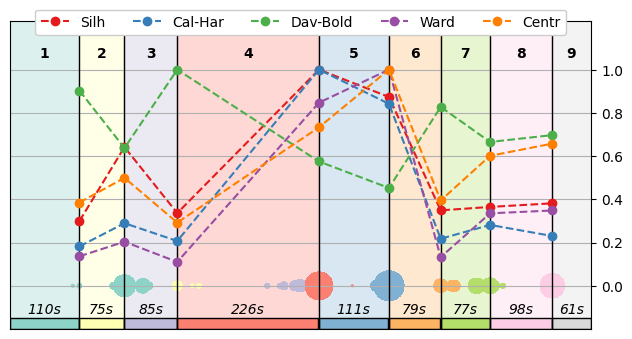

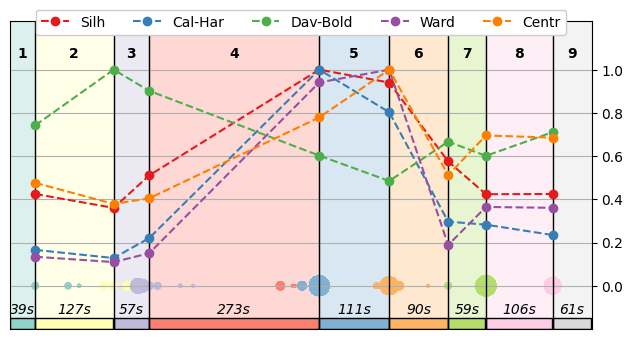

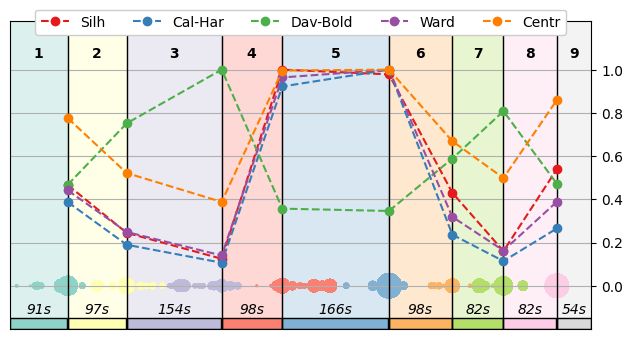

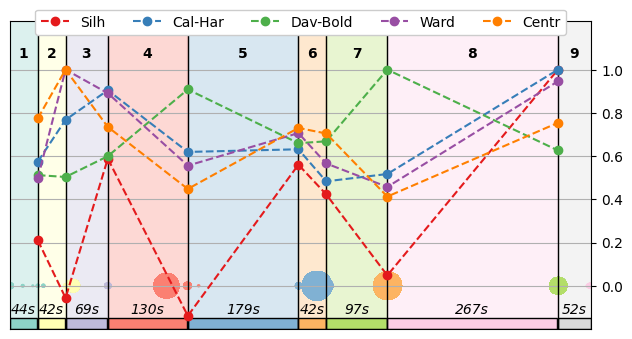

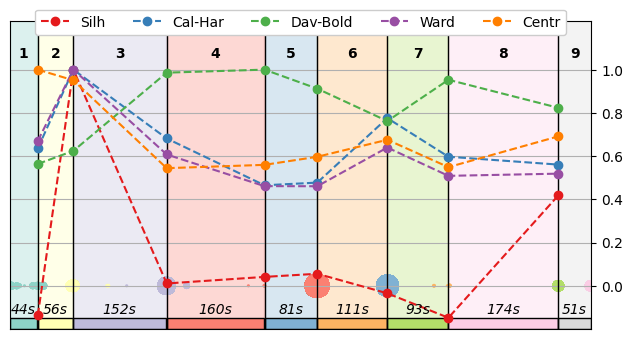

...

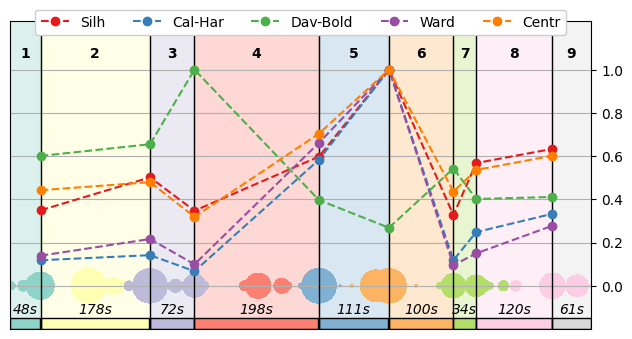

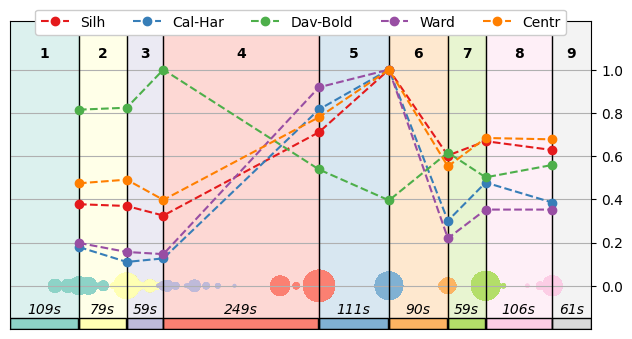

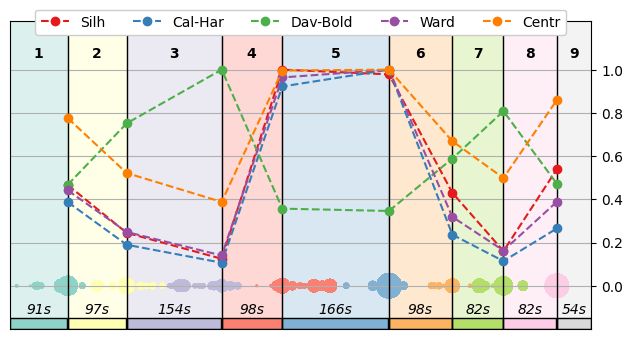

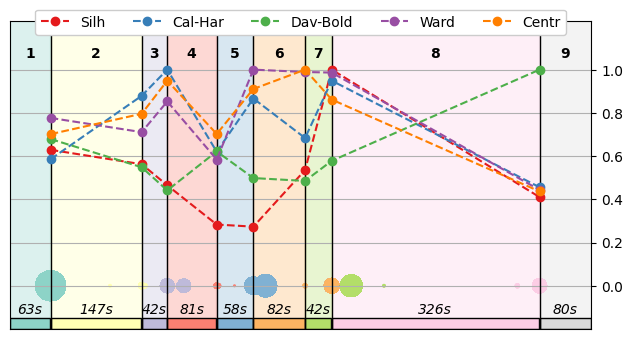

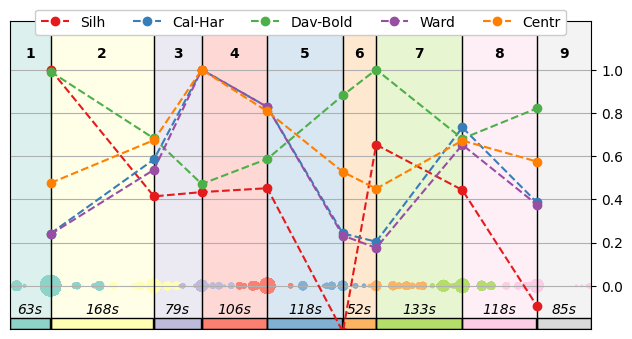

In [9]:
def process_qsda(features: pandas.DataFrame, folder: str, min_unique_values: int):
    qsda = SDA.QSDA(
        n_jobs = 1,
        qsda_n_jobs = 5,
        scores_folder = folder,

        threshold = DEFAULT_QSDA_THRESHOLD,
        min_unique_values = min_unique_values
    )
    return qsda.select(features)[0]
    
def analyze(all_features: pandas.DataFrame, min_unique_values: int, folder: str):
    folder = f"{subj}/{exp}/{folder}/{min_unique_values}"
    run_sda(all_features, 15, folder)

for min_unique_values in tqdm.tqdm(TRY_MIN_UNIQUE_VALUES):
    original_topological = pandas.read_feather(f"{subj}/exp_full_flow/features/features.feather")
    original_qsda = process_qsda(original_topological, f"{subj}/exp_full_flow/qsda", min_unique_values)
    original_combined = pandas.concat([ original_traditional, original_qsda ], axis = 1)

    noise_topological = pandas.read_feather(f"{subj}/exp_noise/features/features.feather")
    noise_qsda = process_qsda(noise_topological, f"{subj}/exp_noise/qsda", min_unique_values)
    if subj == "Subj2":
        noise_qsda = noise_qsda[:-2]

    shuffle_order = numpy.load(f"{subj}/exp_shuffled/shuffle_order.npy")
    shuffle_order = shuffle_order[shuffle_order < len(epochs)]
    shuffled_traditional = original_traditional.to_numpy()[shuffle_order]

    shuffled_topological = pandas.read_feather(f"{subj}/exp_shuffled/features/features.feather")
    shuffled_qsda = process_qsda(shuffled_topological, f"{subj}/exp_shuffled/qsda", min_unique_values)
    if subj == "Subj2":
        shuffled_qsda = shuffled_qsda[:-2]
    shuffled_combined = numpy.concatenate([ shuffled_traditional, shuffled_qsda ], axis = 1)

    # analyze(original_traditional, min_unique_values, "original_traditional")
    # analyze(original_topological, min_unique_values, "original_topological")
    analyze(original_qsda, min_unique_values, "original_qsda")
    analyze(original_combined, min_unique_values, "original_combined")
    analyze(noise_qsda, min_unique_values, "noise_qsda")
    # analyze(shuffled_traditional, min_unique_values, "shuffled_traditional")
    analyze(shuffled_qsda, min_unique_values, "shuffled_qsda")
    analyze(shuffled_combined, min_unique_values, "shuffled_combined")

### QSDA threshold

In [10]:
exp = "exp_hyperparameters/qsda_threshold"
os.makedirs(f"{subj}/{exp}", exist_ok = True)

TRY_THRESHOLDS = [100, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2500, 3000, 4000]

  0%|          | 0/12 [00:00<?, ?it/s]

Using threshold 0.6282588385123093
Using threshold 0.5985880918695241
Using threshold 0.4673472726714357


  8%|▊         | 1/12 [05:38<1:02:06, 338.77s/it]

Using threshold 0.5612223560126751
Using threshold 0.5043058722715307
Using threshold 0.4091346487933976


 17%|█▋        | 2/12 [11:25<57:14, 343.46s/it]  

Using threshold 0.5157068639168061
Using threshold 0.4295538183770771
Using threshold 0.3616719723072412


 25%|██▌       | 3/12 [17:21<52:21, 349.09s/it]

Using threshold 0.4808335560710666
Using threshold 0.3782084720638443
Using threshold 0.3263590019097712


 33%|███▎      | 4/12 [23:09<46:30, 348.87s/it]

Using threshold 0.4494684374686493
Using threshold 0.3420690138380198
Using threshold 0.3016829514151717


d:\TopoEEG\SDA\analytics\plot_stats.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1, figsize = (7.5, 4))
 42%|████▏     | 5/12 [29:24<41:47, 358.25s/it]

Using threshold 0.4283631703534629
Using threshold 0.3118744911674077
Using threshold 0.2761909026783792


 50%|█████     | 6/12 [35:43<36:30, 365.09s/it]

Using threshold 0.4086531639639025
Using threshold 0.2800391566756629
Using threshold 0.2557868506815485


 58%|█████▊    | 7/12 [42:21<31:20, 376.02s/it]

Using threshold 0.3948438623589358
Using threshold 0.2607618199544967
Using threshold 0.2426421655571799


 67%|██████▋   | 8/12 [49:06<25:40, 385.23s/it]

Using threshold 0.3790617739459624
Using threshold 0.2364658762500537
Using threshold 0.2271916737804269


 75%|███████▌  | 9/12 [56:16<19:57, 399.24s/it]

Using threshold 0.3551712334792832
Using threshold 0.2025227732091735
Using threshold 0.2003113504848452


 83%|████████▎ | 10/12 [1:03:32<13:41, 410.65s/it]

Using threshold 0.3319919588339691
Using threshold 0.175191075330572
Using threshold 0.1794915716754475


 92%|█████████▏| 11/12 [1:10:58<07:01, 421.42s/it]

Using threshold 0.2962739664858643
Using threshold 0.1137279710478644
Using threshold 0.1457896167661435


100%|██████████| 12/12 [1:18:26<00:00, 392.21s/it]


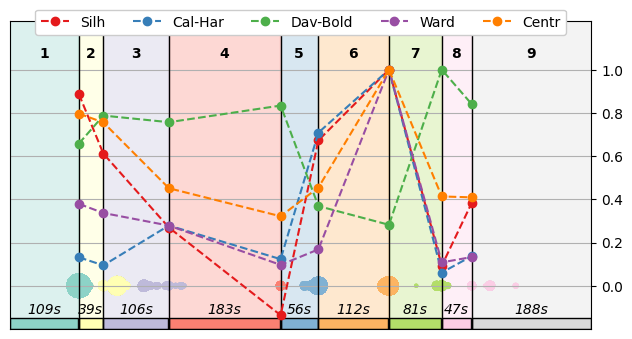

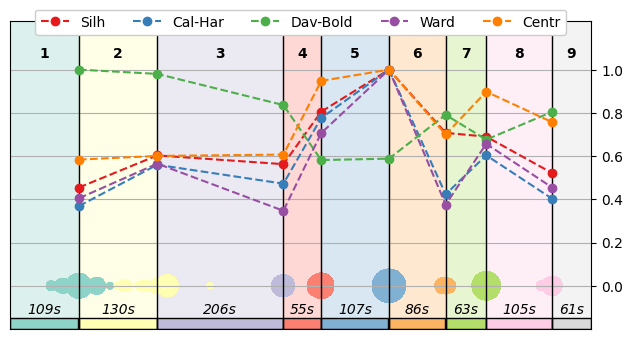

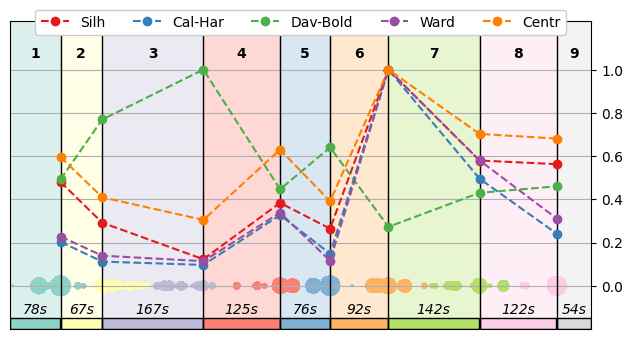

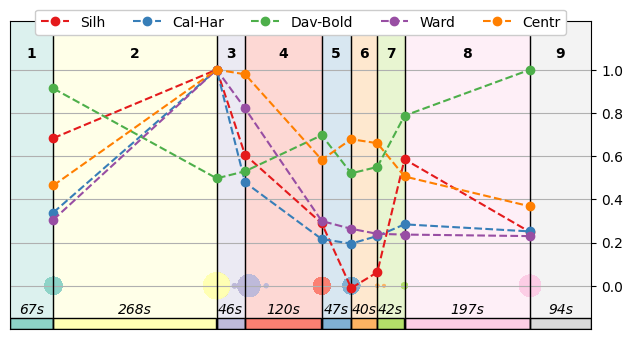

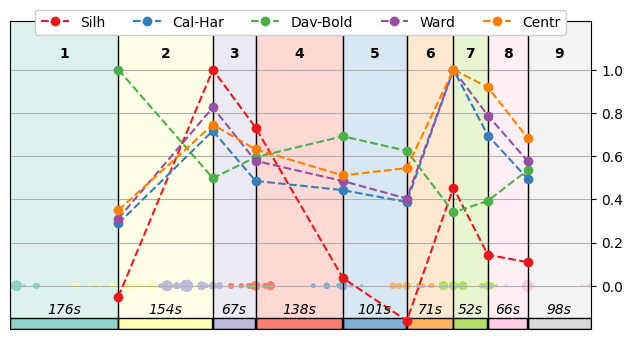

...

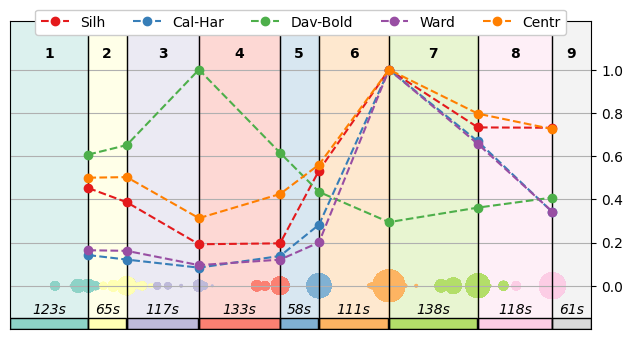

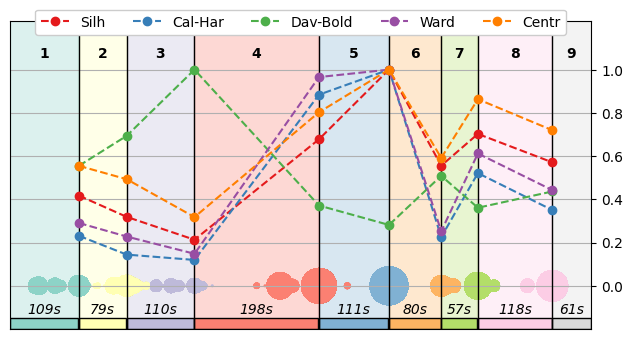

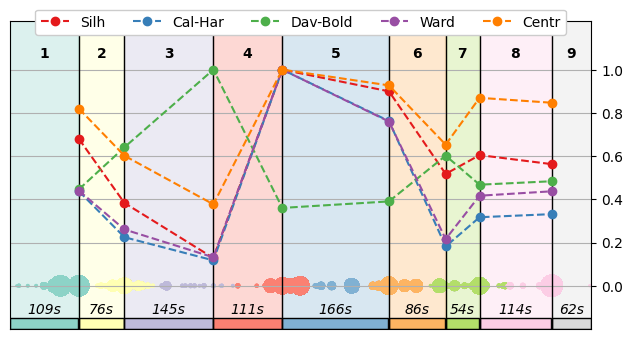

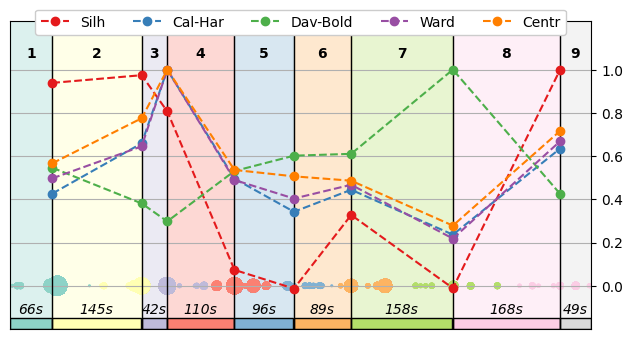

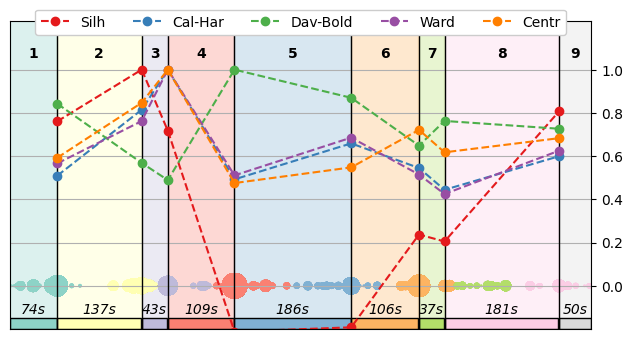

In [11]:
def process_qsda(features: pandas.DataFrame, folder: str, threshold: int):
    qsda = SDA.QSDA(
        n_jobs = 1,
        qsda_n_jobs = 5,
        scores_folder = folder,

        threshold = threshold,
        min_unique_values = DEFAULT_UNIQUE_VALUES_THRESHOLD
    )
    return qsda.select(features)[0]
    
def analyze(all_features: pandas.DataFrame, threshold: int, folder: str):
    folder = f"{subj}/{exp}/{folder}/{threshold}"
    run_sda(all_features, 15, folder)

for threshold in tqdm.tqdm(TRY_THRESHOLDS):
    original_topological = pandas.read_feather(f"{subj}/exp_full_flow/features/features.feather")
    original_qsda = process_qsda(original_topological, f"{subj}/exp_full_flow/qsda", threshold)
    original_combined = pandas.concat([ original_traditional, original_qsda ], axis = 1)

    noise_topological = pandas.read_feather(f"{subj}/exp_noise/features/features.feather")
    noise_qsda = process_qsda(noise_topological, f"{subj}/exp_noise/qsda", threshold)
    if subj == "Subj2":
        noise_qsda = noise_qsda[:-2]

    shuffle_order = numpy.load(f"{subj}/exp_shuffled/shuffle_order.npy")
    shuffle_order = shuffle_order[shuffle_order < len(epochs)]
    shuffled_traditional = original_traditional.to_numpy()[shuffle_order]

    shuffled_topological = pandas.read_feather(f"{subj}/exp_shuffled/features/features.feather")
    shuffled_qsda = process_qsda(shuffled_topological, f"{subj}/exp_shuffled/qsda", threshold)
    if subj == "Subj2":
        shuffled_qsda = shuffled_qsda[:-2]
    shuffled_combined = numpy.concatenate([ shuffled_traditional, shuffled_qsda ], axis = 1)

    # analyze(original_traditional, threshold, "original_traditional")
    # analyze(original_topological, threshold, "original_topological")
    analyze(original_qsda, threshold, "original_qsda")
    analyze(original_combined, threshold, "original_combined")
    analyze(noise_qsda, threshold, "noise_qsda")
    # analyze(shuffled_traditional, threshold, "shuffled_traditional")
    analyze(shuffled_qsda, threshold, "shuffled_qsda")
    analyze(shuffled_combined, threshold, "shuffled_combined")

### Filtering

In [12]:
exp = "exp_hyperparameters/filtering"
os.makedirs(f"{subj}/{exp}", exist_ok = True)

TRY_THRESHOLDS = [5, 10, 15, 20, 25, 35, 40, 45, 50]

TRYING: 5
Filtered diagrams: (39748, 191, 3)
Calculating Betti features


 betti: 100%|██████████| 39748/39748 [00:26<00:00, 1527.63it/s]


Calculating landscape features


 landscape: 100%|██████████| 39748/39748 [00:32<00:00, 1226.29it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 39748/39748 [00:32<00:00, 1207.95it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:38<00:00,  2.98s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 39748/39748 [01:17<00:00, 515.15it/s]


Features: (1046, 7980)
Filtered diagrams: (25104, 46, 3)
Calculating Betti features


 betti: 100%|██████████| 25104/25104 [00:46<00:00, 542.60it/s] 


Calculating landscape features


 landscape: 100%|██████████| 25104/25104 [00:34<00:00, 728.47it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 25104/25104 [00:34<00:00, 719.72it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:08<00:00,  1.49it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 25104/25104 [01:38<00:00, 255.13it/s]


Features: (1046, 10872)
Filtered diagrams: (1046, 203, 3)
Calculating Betti features


overall betti: 100%|██████████| 1046/1046 [00:01<00:00, 610.22it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:01<00:00, 658.67it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:00<00:00, 1078.60it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00, 11.14it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:02<00:00, 467.80it/s]


Features: (1046, 291)
Using threshold 0.4
Filtered diagrams: (41840, 183, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 41840/41840 [00:07<00:00, 5803.38it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 41840/41840 [00:07<00:00, 5913.29it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:44<00:00,  3.39s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 41840/41840 [00:17<00:00, 2362.83it/s]


Features: (1046, 4720)
Filtered diagrams: (1046, 404, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:00<00:00, 2594.81it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:00<00:00, 2536.39it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00,  6.53it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:00<00:00, 1961.13it/s]


Features: (1046, 160)
Using threshold 0.4
Filtered diagrams: (41840, 187, 3)
Calculating Betti features


 betti: 100%|██████████| 41840/41840 [00:28<00:00, 1466.50it/s]


Calculating landscape features


 landscape: 100%|██████████| 41840/41840 [00:30<00:00, 1376.76it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 41840/41840 [00:24<00:00, 1732.99it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:39<00:00,  3.07s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 41840/41840 [01:08<00:00, 609.30it/s]


Features: (1102, 7980)
Filtered diagrams: (25104, 50, 3)
Calculating Betti features


 betti: 100%|██████████| 25104/25104 [00:32<00:00, 765.14it/s] 


Calculating landscape features


 landscape: 100%|██████████| 25104/25104 [00:35<00:00, 714.73it/s] 


Calculating silhouette features


 silhouette-2: 100%|██████████| 25104/25104 [00:32<00:00, 765.60it/s] 


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:07<00:00,  1.68it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 25104/25104 [01:19<00:00, 314.81it/s]


Features: (1142, 9966)
Filtered diagrams: (1046, 197, 3)
Calculating Betti features


overall betti: 100%|██████████| 1046/1046 [00:01<00:00, 954.45it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:01<00:00, 987.55it/s] 


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:00<00:00, 1048.09it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00, 12.17it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:02<00:00, 448.52it/s]


Features: (1046, 291)
Using threshold 0.4
TRYING: 10
Filtered diagrams: (39748, 180, 3)
Calculating Betti features


 betti: 100%|██████████| 39748/39748 [00:23<00:00, 1662.49it/s]


Calculating landscape features


 landscape: 100%|██████████| 39748/39748 [00:23<00:00, 1710.23it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 39748/39748 [00:23<00:00, 1666.44it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:34<00:00,  2.67s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 39748/39748 [01:03<00:00, 628.74it/s]


Features: (1046, 7980)
Filtered diagrams: (25104, 46, 3)
Calculating Betti features


 betti: 100%|██████████| 25104/25104 [00:34<00:00, 737.00it/s]


Calculating landscape features


 landscape: 100%|██████████| 25104/25104 [00:33<00:00, 749.29it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 25104/25104 [00:33<00:00, 739.29it/s] 


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:08<00:00,  1.48it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 25104/25104 [01:19<00:00, 316.84it/s]


Features: (1046, 10872)
Filtered diagrams: (1046, 197, 3)
Calculating Betti features


overall betti: 100%|██████████| 1046/1046 [00:01<00:00, 1038.23it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:00<00:00, 1076.68it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:01<00:00, 1031.96it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00, 11.77it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:02<00:00, 458.65it/s]


Features: (1046, 291)
Using threshold 0.4
Filtered diagrams: (41840, 179, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 41840/41840 [00:06<00:00, 6309.16it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 41840/41840 [00:08<00:00, 4896.76it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:35<00:00,  2.70s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 41840/41840 [00:20<00:00, 2074.12it/s]


Features: (1046, 4720)
Filtered diagrams: (1046, 377, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:00<00:00, 2173.31it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:00<00:00, 2390.96it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:02<00:00,  4.64it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:00<00:00, 1139.11it/s]


Features: (1046, 160)
Using threshold 0.4
Filtered diagrams: (41840, 175, 3)
Calculating Betti features


 betti: 100%|██████████| 41840/41840 [00:25<00:00, 1636.84it/s]


Calculating landscape features


 landscape: 100%|██████████| 41840/41840 [00:27<00:00, 1502.58it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 41840/41840 [00:26<00:00, 1603.23it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:40<00:00,  3.14s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 41840/41840 [01:14<00:00, 561.25it/s]


Features: (1102, 7980)
Filtered diagrams: (25104, 48, 3)
Calculating Betti features


 betti: 100%|██████████| 25104/25104 [00:37<00:00, 666.48it/s]


Calculating landscape features


 landscape: 100%|██████████| 25104/25104 [00:38<00:00, 647.02it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 25104/25104 [00:34<00:00, 727.98it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:07<00:00,  1.73it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 25104/25104 [01:20<00:00, 313.79it/s]


Features: (1142, 9966)
Filtered diagrams: (1046, 190, 3)
Calculating Betti features


overall betti: 100%|██████████| 1046/1046 [00:00<00:00, 1408.70it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:00<00:00, 1408.62it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:00<00:00, 1320.84it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00, 12.17it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:02<00:00, 517.44it/s]


Features: (1046, 291)
Using threshold 0.4
TRYING: 15
Filtered diagrams: (39748, 173, 3)
Calculating Betti features


 betti: 100%|██████████| 39748/39748 [00:22<00:00, 1753.63it/s]


Calculating landscape features


 landscape: 100%|██████████| 39748/39748 [00:22<00:00, 1753.67it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 39748/39748 [00:24<00:00, 1639.78it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:34<00:00,  2.63s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 39748/39748 [01:05<00:00, 609.20it/s]


Features: (1046, 7980)
Filtered diagrams: (25104, 44, 3)
Calculating Betti features


 betti: 100%|██████████| 25104/25104 [00:34<00:00, 723.74it/s] 


Calculating landscape features


 landscape: 100%|██████████| 25104/25104 [00:33<00:00, 749.69it/s] 


Calculating silhouette features


 silhouette-2: 100%|██████████| 25104/25104 [00:34<00:00, 726.99it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:06<00:00,  1.87it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 25104/25104 [01:18<00:00, 318.02it/s]


Features: (1046, 10872)
Filtered diagrams: (1046, 185, 3)
Calculating Betti features


overall betti: 100%|██████████| 1046/1046 [00:01<00:00, 1036.27it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:01<00:00, 1042.39it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:01<00:00, 1036.14it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00, 12.81it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:02<00:00, 455.35it/s]


Features: (1046, 291)
Using threshold 0.4
Filtered diagrams: (41840, 173, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 41840/41840 [00:07<00:00, 5702.06it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 41840/41840 [00:07<00:00, 5965.82it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:31<00:00,  2.44s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 41840/41840 [00:17<00:00, 2461.12it/s]


Features: (1046, 4720)
Filtered diagrams: (1046, 352, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:00<00:00, 2692.80it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:00<00:00, 2597.11it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00,  7.93it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:00<00:00, 1838.74it/s]


Features: (1046, 160)
Using threshold 0.4
Filtered diagrams: (41840, 163, 3)
Calculating Betti features


 betti: 100%|██████████| 41840/41840 [00:23<00:00, 1749.49it/s]


Calculating landscape features


 landscape: 100%|██████████| 41840/41840 [00:24<00:00, 1694.10it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 41840/41840 [00:25<00:00, 1671.98it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:43<00:00,  3.37s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 41840/41840 [01:17<00:00, 537.42it/s]


Features: (1102, 7980)
Filtered diagrams: (25104, 46, 3)
Calculating Betti features


 betti: 100%|██████████| 25104/25104 [00:35<00:00, 701.37it/s]


Calculating landscape features


 landscape: 100%|██████████| 25104/25104 [00:47<00:00, 527.53it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 25104/25104 [00:37<00:00, 667.68it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:07<00:00,  1.74it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 25104/25104 [01:26<00:00, 290.74it/s]


Features: (1142, 9966)
Filtered diagrams: (1046, 186, 3)
Calculating Betti features


overall betti: 100%|██████████| 1046/1046 [00:01<00:00, 856.80it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:01<00:00, 863.87it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:01<00:00, 849.24it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00, 10.65it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:02<00:00, 379.66it/s]


Features: (1046, 291)
Using threshold 0.4
TRYING: 20
Filtered diagrams: (39748, 165, 3)
Calculating Betti features


 betti: 100%|██████████| 39748/39748 [00:23<00:00, 1692.55it/s]


Calculating landscape features


 landscape: 100%|██████████| 39748/39748 [00:22<00:00, 1730.05it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 39748/39748 [00:23<00:00, 1704.57it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:33<00:00,  2.57s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 39748/39748 [01:04<00:00, 613.00it/s]


Features: (1046, 7980)
Filtered diagrams: (25104, 43, 3)
Calculating Betti features


 betti: 100%|██████████| 25104/25104 [00:32<00:00, 762.42it/s] 


Calculating landscape features


 landscape: 100%|██████████| 25104/25104 [00:33<00:00, 746.85it/s] 


Calculating silhouette features


 silhouette-2: 100%|██████████| 25104/25104 [00:32<00:00, 770.98it/s] 


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:06<00:00,  1.88it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 25104/25104 [01:19<00:00, 314.83it/s]


Features: (1046, 10872)
Filtered diagrams: (1046, 177, 3)
Calculating Betti features


overall betti: 100%|██████████| 1046/1046 [00:00<00:00, 1166.98it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:00<00:00, 1086.03it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:01<00:00, 1045.53it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:00<00:00, 13.35it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:01<00:00, 549.76it/s]


Features: (1046, 291)
Using threshold 0.4
Filtered diagrams: (41840, 163, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 41840/41840 [00:07<00:00, 5472.72it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 41840/41840 [00:06<00:00, 6544.48it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:38<00:00,  2.93s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 41840/41840 [00:17<00:00, 2332.28it/s]


Features: (1046, 4720)
Filtered diagrams: (1046, 324, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:00<00:00, 2644.80it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:00<00:00, 2571.46it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00,  8.82it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:00<00:00, 1915.10it/s]


Features: (1046, 160)
Using threshold 0.4
Filtered diagrams: (41840, 155, 3)
Calculating Betti features


 betti: 100%|██████████| 41840/41840 [00:24<00:00, 1715.59it/s]


Calculating landscape features


 landscape: 100%|██████████| 41840/41840 [00:25<00:00, 1660.04it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 41840/41840 [00:24<00:00, 1700.60it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:31<00:00,  2.41s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 41840/41840 [01:08<00:00, 614.25it/s]


Features: (1102, 7980)
Filtered diagrams: (25104, 46, 3)
Calculating Betti features


 betti: 100%|██████████| 25104/25104 [00:33<00:00, 753.35it/s]


Calculating landscape features


 landscape: 100%|██████████| 25104/25104 [00:34<00:00, 733.21it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 25104/25104 [00:44<00:00, 562.63it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:07<00:00,  1.75it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 25104/25104 [01:29<00:00, 279.40it/s]


Features: (1142, 9966)
Filtered diagrams: (1046, 176, 3)
Calculating Betti features


overall betti: 100%|██████████| 1046/1046 [00:00<00:00, 1052.94it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:01<00:00, 986.69it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:01<00:00, 962.83it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00, 12.33it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:02<00:00, 453.60it/s]


Features: (1046, 291)
Using threshold 0.4


d:\TopoEEG\SDA\analytics\plot_stats.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1, figsize = (7.5, 4))


TRYING: 25
Filtered diagrams: (39748, 162, 3)
Calculating Betti features


 betti: 100%|██████████| 39748/39748 [00:23<00:00, 1672.59it/s]


Calculating landscape features


 landscape: 100%|██████████| 39748/39748 [00:23<00:00, 1674.16it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 39748/39748 [00:24<00:00, 1651.92it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:31<00:00,  2.43s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 39748/39748 [01:03<00:00, 621.40it/s]


Features: (1046, 7980)
Filtered diagrams: (25104, 42, 3)
Calculating Betti features


 betti: 100%|██████████| 25104/25104 [00:34<00:00, 724.76it/s]


Calculating landscape features


 landscape: 100%|██████████| 25104/25104 [00:33<00:00, 739.60it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 25104/25104 [00:32<00:00, 765.14it/s] 


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:06<00:00,  1.94it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 25104/25104 [01:18<00:00, 320.09it/s]


Features: (1046, 10872)
Filtered diagrams: (1046, 170, 3)
Calculating Betti features


overall betti: 100%|██████████| 1046/1046 [00:00<00:00, 1075.04it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:00<00:00, 1083.92it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:00<00:00, 1132.50it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:00<00:00, 15.24it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:01<00:00, 524.85it/s]


Features: (1046, 291)
Using threshold 0.4
Filtered diagrams: (41840, 160, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 41840/41840 [00:06<00:00, 6502.01it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 41840/41840 [00:07<00:00, 5689.18it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:37<00:00,  2.87s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 41840/41840 [00:18<00:00, 2313.39it/s]


Features: (1046, 4720)
Filtered diagrams: (1046, 305, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:00<00:00, 2885.22it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:00<00:00, 2216.48it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00,  8.63it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:00<00:00, 1552.01it/s]


Features: (1046, 160)
Using threshold 0.4
Filtered diagrams: (41840, 151, 3)
Calculating Betti features


 betti: 100%|██████████| 41840/41840 [00:25<00:00, 1625.95it/s]


Calculating landscape features


 landscape: 100%|██████████| 41840/41840 [00:24<00:00, 1700.98it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 41840/41840 [00:24<00:00, 1693.25it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:30<00:00,  2.34s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 41840/41840 [01:07<00:00, 617.62it/s]


Features: (1102, 7980)
Filtered diagrams: (25104, 45, 3)
Calculating Betti features


 betti: 100%|██████████| 25104/25104 [00:34<00:00, 721.34it/s]


Calculating landscape features


 landscape: 100%|██████████| 25104/25104 [00:33<00:00, 757.76it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 25104/25104 [00:33<00:00, 745.72it/s] 


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:07<00:00,  1.83it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 25104/25104 [01:17<00:00, 322.33it/s]


Features: (1142, 9966)
Filtered diagrams: (1046, 170, 3)
Calculating Betti features


overall betti: 100%|██████████| 1046/1046 [00:00<00:00, 1060.71it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:00<00:00, 1173.37it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:01<00:00, 1024.71it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:00<00:00, 13.55it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:02<00:00, 472.34it/s]


Features: (1046, 291)
Using threshold 0.4
TRYING: 35
Filtered diagrams: (39748, 144, 3)
Calculating Betti features


 betti: 100%|██████████| 39748/39748 [00:24<00:00, 1634.48it/s]


Calculating landscape features


 landscape: 100%|██████████| 39748/39748 [00:27<00:00, 1434.94it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 39748/39748 [00:24<00:00, 1654.81it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:31<00:00,  2.45s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 39748/39748 [01:06<00:00, 599.56it/s]


Features: (1046, 7980)
Filtered diagrams: (25104, 40, 3)
Calculating Betti features


 betti: 100%|██████████| 25104/25104 [00:34<00:00, 733.30it/s]


Calculating landscape features


 landscape: 100%|██████████| 25104/25104 [00:32<00:00, 774.63it/s] 


Calculating silhouette features


 silhouette-2: 100%|██████████| 25104/25104 [00:33<00:00, 740.58it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:06<00:00,  2.04it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 25104/25104 [01:17<00:00, 321.99it/s]


Features: (1046, 10872)
Filtered diagrams: (1046, 158, 3)
Calculating Betti features


overall betti: 100%|██████████| 1046/1046 [00:01<00:00, 1014.20it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:01<00:00, 1018.41it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:01<00:00, 1031.30it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:00<00:00, 15.78it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:01<00:00, 583.32it/s]


Features: (1046, 291)
Using threshold 0.4
Filtered diagrams: (41840, 150, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 41840/41840 [00:07<00:00, 5820.03it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 41840/41840 [00:07<00:00, 5901.73it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:27<00:00,  2.11s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 41840/41840 [00:16<00:00, 2487.62it/s]


Features: (1046, 4720)
Filtered diagrams: (1046, 263, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:00<00:00, 2693.40it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:00<00:00, 3530.30it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00,  8.07it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:00<00:00, 2017.77it/s]


Features: (1046, 160)
Using threshold 0.4
Filtered diagrams: (41840, 137, 3)
Calculating Betti features


 betti: 100%|██████████| 41840/41840 [00:25<00:00, 1648.49it/s]


Calculating landscape features


 landscape: 100%|██████████| 41840/41840 [00:25<00:00, 1669.10it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 41840/41840 [00:22<00:00, 1846.52it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:30<00:00,  2.31s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 41840/41840 [01:07<00:00, 624.30it/s]


Features: (1102, 7980)
Filtered diagrams: (25104, 43, 3)
Calculating Betti features


 betti: 100%|██████████| 25104/25104 [00:34<00:00, 734.93it/s]


Calculating landscape features


 landscape: 100%|██████████| 25104/25104 [00:34<00:00, 723.98it/s] 


Calculating silhouette features


 silhouette-2: 100%|██████████| 25104/25104 [00:32<00:00, 764.70it/s] 


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:08<00:00,  1.51it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 25104/25104 [01:20<00:00, 310.53it/s]


Features: (1142, 9966)
Filtered diagrams: (1046, 151, 3)
Calculating Betti features


overall betti: 100%|██████████| 1046/1046 [00:01<00:00, 1044.28it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:00<00:00, 1068.26it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:00<00:00, 1076.04it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:00<00:00, 15.07it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:02<00:00, 467.81it/s]


Features: (1046, 291)
Using threshold 0.4
TRYING: 40
Filtered diagrams: (39748, 140, 3)
Calculating Betti features


 betti: 100%|██████████| 39748/39748 [00:24<00:00, 1642.55it/s]


Calculating landscape features


 landscape: 100%|██████████| 39748/39748 [00:26<00:00, 1482.90it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 39748/39748 [00:24<00:00, 1649.04it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:33<00:00,  2.55s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 39748/39748 [01:11<00:00, 553.31it/s]


Features: (1046, 7980)
Filtered diagrams: (25104, 39, 3)
Calculating Betti features


 betti: 100%|██████████| 25104/25104 [00:34<00:00, 724.77it/s]


Calculating landscape features


 landscape: 100%|██████████| 25104/25104 [00:42<00:00, 592.85it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 25104/25104 [00:37<00:00, 662.24it/s] 


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:06<00:00,  2.01it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 25104/25104 [01:18<00:00, 318.77it/s]


Features: (1046, 10872)
Filtered diagrams: (1046, 146, 3)
Calculating Betti features


overall betti: 100%|██████████| 1046/1046 [00:01<00:00, 1015.38it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:01<00:00, 1039.43it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:00<00:00, 1177.27it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:00<00:00, 15.97it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:02<00:00, 443.10it/s]


Features: (1046, 291)
Using threshold 0.4
Filtered diagrams: (41840, 142, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 41840/41840 [00:06<00:00, 6349.11it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 41840/41840 [00:08<00:00, 5193.86it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:28<00:00,  2.20s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 41840/41840 [00:17<00:00, 2443.47it/s]


Features: (1046, 4720)
Filtered diagrams: (1046, 240, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:00<00:00, 2646.99it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:00<00:00, 2857.74it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00, 11.26it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:00<00:00, 1453.06it/s]


Features: (1046, 160)
Using threshold 0.4
Filtered diagrams: (41840, 132, 3)
Calculating Betti features


 betti: 100%|██████████| 41840/41840 [00:24<00:00, 1674.60it/s]


Calculating landscape features


 landscape: 100%|██████████| 41840/41840 [00:24<00:00, 1705.45it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 41840/41840 [00:24<00:00, 1675.02it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:26<00:00,  2.05s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 41840/41840 [01:06<00:00, 628.48it/s]


Features: (1102, 7980)
Filtered diagrams: (25104, 41, 3)
Calculating Betti features


 betti: 100%|██████████| 25104/25104 [00:34<00:00, 730.82it/s]


Calculating landscape features


 landscape: 100%|██████████| 25104/25104 [00:34<00:00, 732.36it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 25104/25104 [00:32<00:00, 771.04it/s] 


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:08<00:00,  1.54it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 25104/25104 [01:17<00:00, 322.38it/s]


Features: (1142, 9966)
Filtered diagrams: (1046, 142, 3)
Calculating Betti features


overall betti: 100%|██████████| 1046/1046 [00:00<00:00, 1365.61it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:00<00:00, 1118.09it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:00<00:00, 1082.03it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:00<00:00, 15.61it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:02<00:00, 449.45it/s]


Features: (1046, 291)
Using threshold 0.4
TRYING: 45
Filtered diagrams: (39748, 132, 3)
Calculating Betti features


 betti: 100%|██████████| 39748/39748 [00:22<00:00, 1777.05it/s]


Calculating landscape features


 landscape: 100%|██████████| 39748/39748 [00:23<00:00, 1677.55it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 39748/39748 [00:23<00:00, 1709.81it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:28<00:00,  2.19s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 39748/39748 [01:15<00:00, 523.84it/s]


Features: (1046, 7980)
Filtered diagrams: (25104, 36, 3)
Calculating Betti features


 betti: 100%|██████████| 25104/25104 [00:40<00:00, 622.22it/s]


Calculating landscape features


 landscape: 100%|██████████| 25104/25104 [00:39<00:00, 635.99it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 25104/25104 [00:40<00:00, 616.25it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:06<00:00,  2.06it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 25104/25104 [01:27<00:00, 287.55it/s]


Features: (1046, 10872)
Filtered diagrams: (1046, 135, 3)
Calculating Betti features


overall betti: 100%|██████████| 1046/1046 [00:01<00:00, 1010.21it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:01<00:00, 1036.15it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:00<00:00, 1065.85it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:00<00:00, 15.21it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:02<00:00, 455.47it/s]


Features: (1046, 291)
Using threshold 0.4
Filtered diagrams: (41840, 139, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 41840/41840 [00:07<00:00, 5715.34it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 41840/41840 [00:11<00:00, 3798.78it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:27<00:00,  2.11s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 41840/41840 [00:17<00:00, 2451.27it/s]


Features: (1046, 4720)
Filtered diagrams: (1046, 224, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:00<00:00, 2169.91it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:00<00:00, 2035.72it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00, 10.23it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:00<00:00, 1515.61it/s]


Features: (1046, 160)
Using threshold 0.4
Filtered diagrams: (41840, 125, 3)
Calculating Betti features


 betti: 100%|██████████| 41840/41840 [00:27<00:00, 1544.03it/s]


Calculating landscape features


 landscape: 100%|██████████| 41840/41840 [00:24<00:00, 1712.13it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 41840/41840 [00:24<00:00, 1694.91it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:25<00:00,  1.98s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 41840/41840 [01:08<00:00, 610.77it/s]


Features: (1102, 7980)
Filtered diagrams: (25104, 36, 3)
Calculating Betti features


 betti: 100%|██████████| 25104/25104 [00:39<00:00, 643.19it/s]


Calculating landscape features


 landscape: 100%|██████████| 25104/25104 [00:34<00:00, 729.44it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 25104/25104 [00:33<00:00, 739.95it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:06<00:00,  2.14it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 25104/25104 [01:17<00:00, 322.94it/s]


Features: (1142, 9966)
Filtered diagrams: (1046, 132, 3)
Calculating Betti features


overall betti: 100%|██████████| 1046/1046 [00:00<00:00, 1095.91it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:00<00:00, 1053.99it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:00<00:00, 1097.06it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:00<00:00, 17.16it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:02<00:00, 434.12it/s]


Features: (1046, 291)
Using threshold 0.4
TRYING: 50
Filtered diagrams: (39748, 116, 3)
Calculating Betti features


 betti: 100%|██████████| 39748/39748 [00:23<00:00, 1667.82it/s]


Calculating landscape features


 landscape: 100%|██████████| 39748/39748 [00:23<00:00, 1698.66it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 39748/39748 [00:23<00:00, 1711.87it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:22<00:00,  1.77s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 39748/39748 [01:03<00:00, 621.30it/s]


Features: (1046, 7980)
Filtered diagrams: (25104, 34, 3)
Calculating Betti features


 betti: 100%|██████████| 25104/25104 [00:33<00:00, 752.51it/s] 


Calculating landscape features


 landscape: 100%|██████████| 25104/25104 [00:34<00:00, 735.06it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 25104/25104 [00:37<00:00, 678.25it/s] 


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:06<00:00,  2.14it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 25104/25104 [01:29<00:00, 280.37it/s]


Features: (1046, 10872)
Filtered diagrams: (1046, 122, 3)
Calculating Betti features


overall betti: 100%|██████████| 1046/1046 [00:01<00:00, 1045.16it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:01<00:00, 1038.74it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:01<00:00, 1038.85it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:00<00:00, 15.87it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:02<00:00, 457.95it/s]


Features: (1046, 291)
Using threshold 0.4
Filtered diagrams: (41840, 133, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 41840/41840 [00:07<00:00, 5459.01it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 41840/41840 [00:10<00:00, 3811.17it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:26<00:00,  2.04s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 41840/41840 [00:17<00:00, 2414.29it/s]


Features: (1046, 4720)
Filtered diagrams: (1046, 205, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:00<00:00, 2049.20it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:00<00:00, 2137.79it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00, 11.26it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:00<00:00, 1568.16it/s]


Features: (1046, 160)
Using threshold 0.4
Filtered diagrams: (41840, 116, 3)
Calculating Betti features


 betti: 100%|██████████| 41840/41840 [00:28<00:00, 1467.75it/s]


Calculating landscape features


 landscape: 100%|██████████| 41840/41840 [00:25<00:00, 1660.65it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 41840/41840 [00:24<00:00, 1682.06it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:26<00:00,  2.04s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 41840/41840 [01:16<00:00, 543.96it/s]


Features: (1102, 7980)
Filtered diagrams: (25104, 34, 3)
Calculating Betti features


 betti: 100%|██████████| 25104/25104 [00:37<00:00, 678.23it/s]


Calculating landscape features


 landscape: 100%|██████████| 25104/25104 [00:34<00:00, 737.95it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 25104/25104 [00:32<00:00, 773.29it/s] 


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:07<00:00,  1.75it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 25104/25104 [01:21<00:00, 307.38it/s]


Features: (1142, 9966)
Filtered diagrams: (1046, 124, 3)
Calculating Betti features


overall betti: 100%|██████████| 1046/1046 [00:00<00:00, 1167.31it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1046/1046 [00:00<00:00, 1071.44it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1046/1046 [00:00<00:00, 1061.33it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:00<00:00, 17.81it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1046/1046 [00:02<00:00, 450.96it/s]


Features: (1046, 291)
Using threshold 0.4


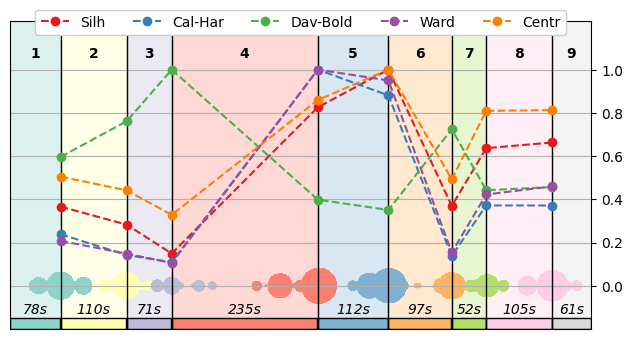

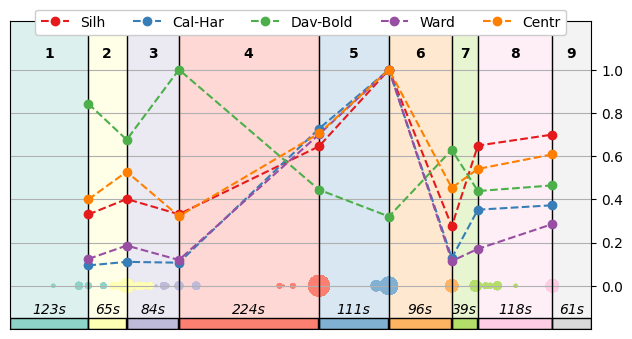

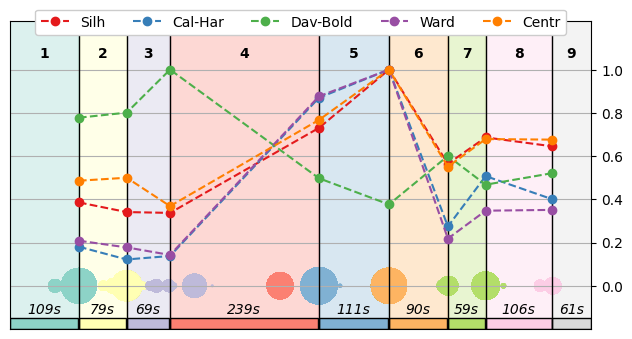

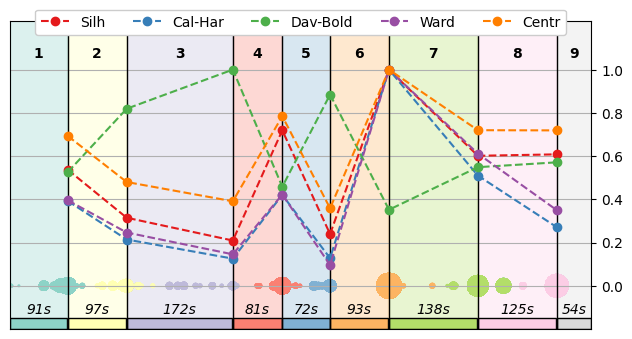

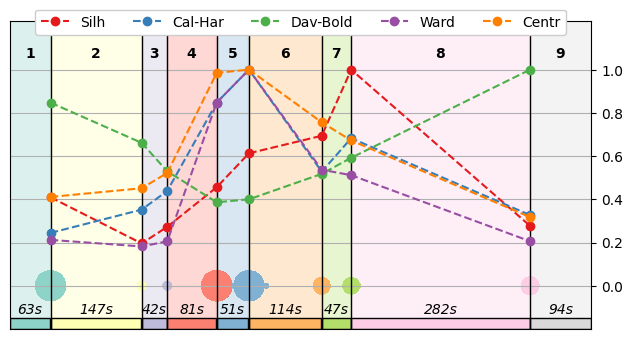

...

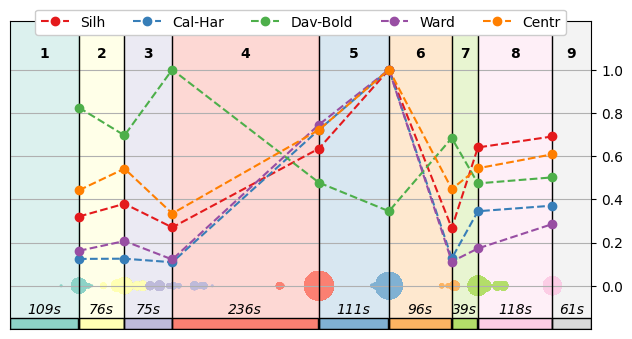

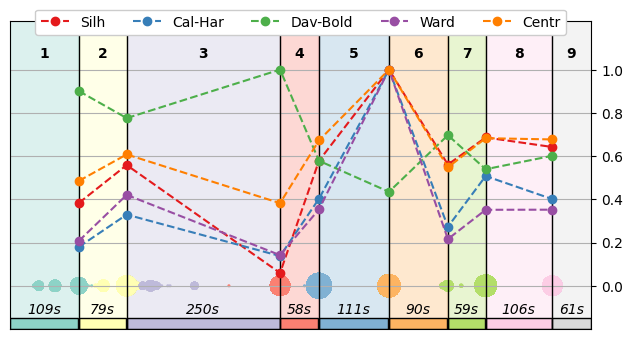

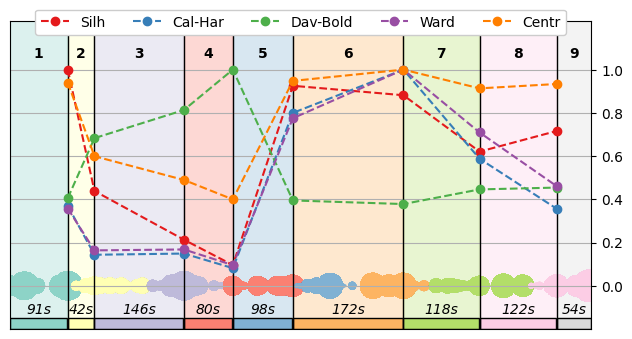

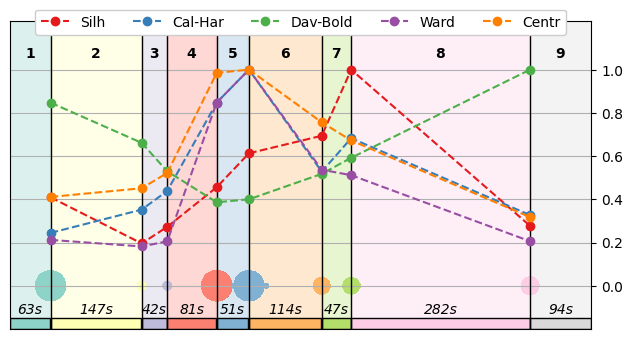

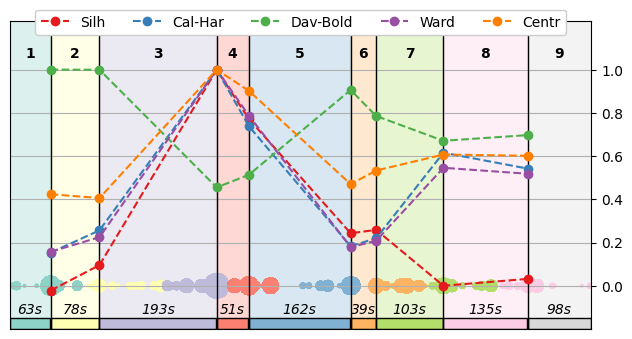

In [13]:
import SDA.topology
import sklearn.preprocessing

def make_features(src_exp: str, threshold: float, reduced: bool = False, n_channels: int = 38):
    folder = f"{subj}/{src_exp}/features"
    
    diagrams = numpy.load(f'{folder}/per_channel/diagrams.npy')
    per_channel_extractor = SDA.topology.PerChannelFeatureExtractor(n_jobs = 5, folder = None, reduced = reduced, filtering_percentile = threshold)
    per_channel_features = per_channel_extractor.calculate_features(n_channels, diagrams)

    if not reduced:
        diagrams = numpy.load(f'{folder}/dissimilarity/diagrams.npy')
        dissimilarity_extractor = SDA.topology.DissimilarityFeatureExtractor(n_jobs = 5, folder = None, reduced = reduced, filtering_percentile = threshold)
        dissimilarity_features = dissimilarity_extractor.calculate_features(len(per_channel_features), diagrams)

    diagrams = numpy.load(f'{folder}/overall/diagrams.npy')
    overall_extractor = SDA.topology.OverallFeatureExtractor(n_jobs = 5, folder = None, reduced = reduced, filtering_percentile = threshold)
    overall_features = overall_extractor.calculate_features(diagrams)

    if reduced:
        all_features = pandas.concat([per_channel_features, overall_features], axis = 1).fillna(0)
    else:
        all_features = pandas.concat([per_channel_features, dissimilarity_features, overall_features], axis = 1).fillna(0)
    
    features = sklearn.preprocessing.StandardScaler().fit_transform(all_features)
    return pandas.DataFrame(features, columns = all_features.columns)

def process_qsda(features: pandas.DataFrame, folder: str):
    qsda = SDA.QSDA(
        n_jobs = 1,
        qsda_n_jobs = 5,
        scores_folder = folder,

        threshold = DEFAULT_QSDA_THRESHOLD,
        min_unique_values = DEFAULT_UNIQUE_VALUES_THRESHOLD
    )
    return qsda.select(features)[0]
    
def analyze(all_features: pandas.DataFrame, threshold: int, folder: str):
    folder = f"{subj}/{exp}/{folder}/{threshold}"
    run_sda(all_features, 15, folder)

for threshold in TRY_THRESHOLDS:
    print(f"TRYING: {threshold}")

    original_topological = make_features("exp_full_flow", threshold)
    original_qsda = process_qsda(original_topological, f"{subj}/exp_full_flow/qsda")
    original_combined = pandas.concat([ original_traditional, original_qsda ], axis = 1)

    noise_topological = make_features("exp_noise", threshold, reduced = True, n_channels = 40)
    noise_qsda = process_qsda(noise_topological, f"{subj}/exp_noise/qsda")
    if subj == "Subj2":
        noise_qsda = noise_qsda[:-2]

    shuffle_order = numpy.load(f"{subj}/exp_shuffled/shuffle_order.npy")
    shuffle_order = shuffle_order[shuffle_order < len(epochs)]
    shuffled_traditional = original_traditional.to_numpy()[shuffle_order]

    shuffled_topological = make_features("exp_shuffled", threshold)
    shuffled_topological = pandas.read_feather(f"{subj}/exp_shuffled/features/features.feather")
    shuffled_qsda = process_qsda(shuffled_topological, f"{subj}/exp_shuffled/qsda")
    if subj == "Subj2":
        shuffled_qsda = shuffled_qsda[:-2]
    shuffled_combined = numpy.concatenate([ shuffled_traditional, shuffled_qsda ], axis = 1)

    # analyze(original_traditional, threshold, "original_traditional")
    analyze(original_topological, threshold, "original_topological")
    analyze(original_qsda, threshold, "original_qsda")
    analyze(original_combined, threshold, "original_combined")
    analyze(noise_qsda, threshold, "noise_qsda")
    # analyze(shuffled_traditional, threshold, "shuffled_traditional")
    analyze(shuffled_qsda, threshold, "shuffled_qsda")
    analyze(shuffled_combined, threshold, "shuffled_combined")